<a href="https://www.kaggle.com/code/subhadipde2000/botanynet?scriptVersionId=244413394" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction:

# Problem Statement:

In [1]:
!nvidia-smi

Sun Jun  8 18:28:56 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   32C    P0             25W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Imports:

In [2]:
import os
os.environ["KERAS_BACKEND"] = "jax"

import keras
import random
import imghdr
import keras_cv
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
import tensorflow as tf
import keras.backend as K
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.utils import image_dataset_from_directory

In [3]:
warnings.filterwarnings('ignore')

In [4]:
# Reproducability
tf.keras.utils.set_random_seed(1024)

# Working Directory Structure:

The current structure of `/kaggle/input/` is as follows:

- /kaggle/input/house-plant-species/house_plant_species/

    - African Violet (Saintpaulia ionantha)/
        - image1.JPG
        - image2.png
        - image3.JPG
        - ...
    
    - Aloe Vera/
        - image1.JPG
        - image2.jpeg
        - image3.png
        - ...
    
    - Anthurium (Anthurium andraeanum)/
        - image1.webp
        - image2.jpg
        - image3.JPG
        - ...
    
    - ...

In [5]:
image_paths = []

for parent_dir, _, files in os.walk('/kaggle/input/house-plant-species/house_plant_species/'):
    for file in files:
        image_path = os.path.join(parent_dir, file)
        if imghdr.what(image_path) in ['jpeg', 'png', 'bmp', 'gif']:
            image_paths.append(image_path)

image_paths.sort()
image_paths[:10]

['/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/1.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/10.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/100.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/101.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/102.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/103.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/104.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/105.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Violet (Saintpaulia ionantha)/106.jpg',
 '/kaggle/input/house-plant-species/house_plant_species/African Vio

# Data Visualizations:

In [6]:
def plot_df(img_paths_list, title=None):
    '''
    This function plots the number of images from each species.
    '''
    
    categories = {x.split('/')[-2] for x in img_paths_list}
    num_images = []
    for x in categories:
        num_images.append(len([path for path in img_paths_list if path.split('/')[-2] == x]))
    
    num_img_df = pd.DataFrame.from_dict(
        {
            'categories': list(categories),
            'num_images': num_images
        }
    )
    num_img_df = num_img_df.sort_values(by='num_images')
    
    plt.figure(figsize=(12, 8), dpi=150)
    plt.title(title)
    plt.xticks(rotation=90)
    ax = sns.barplot(num_img_df, x='categories', y='num_images')
    ax.bar_label(ax.containers[0], fontsize=10, rotation=90);

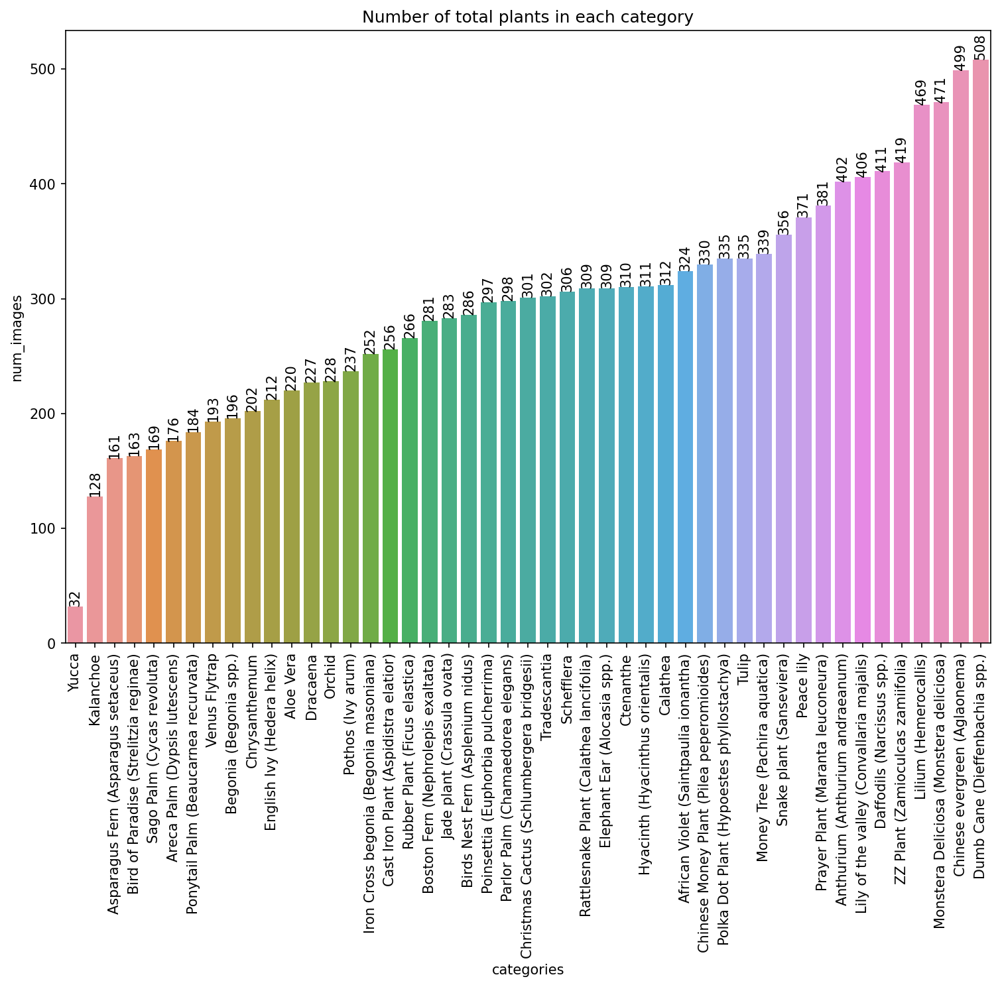

In [7]:
plot_df(image_paths, title='Number of total plants in each category')

In [8]:
# Function for plotting 2 random images from a folder
def plot_random_images_of_each_species(img_path_list):
    categories = {x.split('/')[-2] for x in img_path_list}
    for category in categories:
        img_paths = [path for path in img_path_list if path.split('/')[-2] == category] 
        if len(img_paths) < 4:
            print(f"Not enough images of {category} to display to display.")
            return
        selected_images = random.sample(img_paths, 2)
        fig, axes = plt.subplots(1, 2, figsize=(4, 4), dpi=100)
        for i, ax in enumerate(axes.flat):
            image_path = selected_images[i]
            img = mpimg.imread(image_path)
            ax.imshow(img)
            ax.axis('off')
        class_name = category
        fig.suptitle(class_name, fontsize=16)
        plt.tight_layout()
        plt.show()

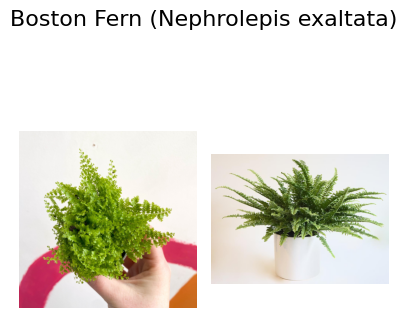

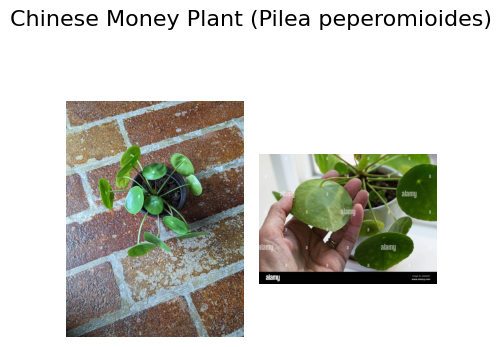

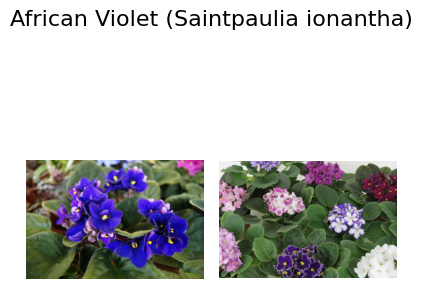

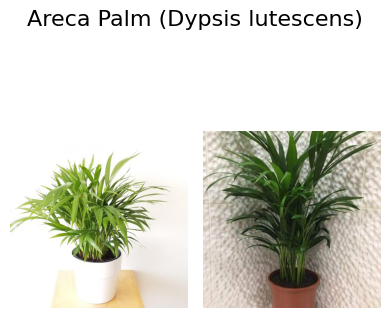

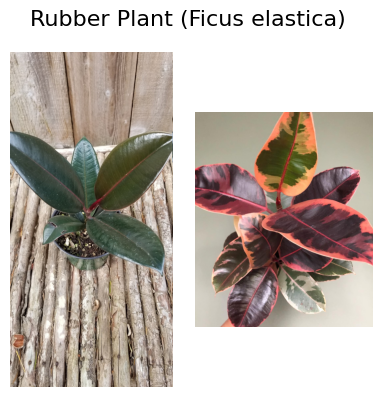

...

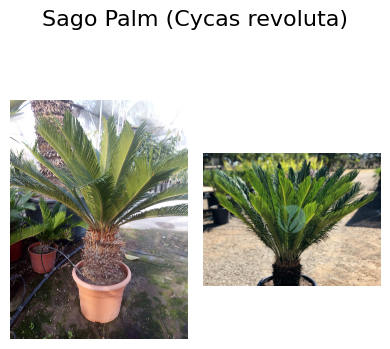

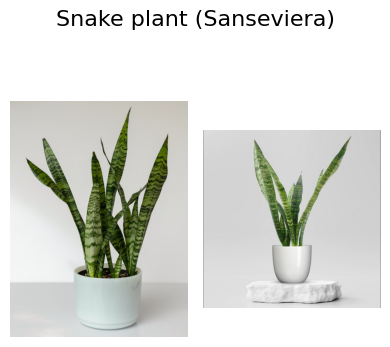

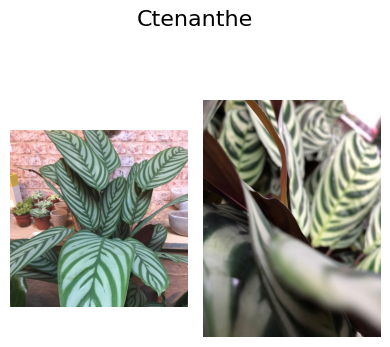

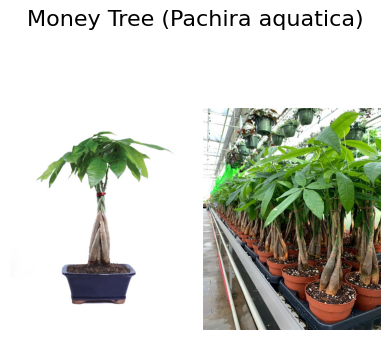

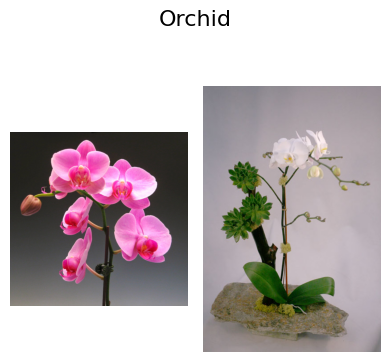

In [9]:
plot_random_images_of_each_species(image_paths)

In [10]:
def get_color_channels_and_filetypes(img_paths_list):
    
    channel_counts = {}
    filetype_dict = {}
    
    for path in img_paths_list:
        _, filetype = os.path.splitext(path)
        if filetype not in filetype_dict:
            filetype_dict[filetype] = 1
        else:
            filetype_dict[filetype] += 1


        try:
            with Image.open(path) as img:
                mode = img.mode
                if mode is not None:
                    if mode in channel_counts:
                        channel_counts[mode] += 1
                    else:
                        channel_counts[mode] = 1

                else:
                    print(f"Unrecognized mode {mode} for file {path}")

        except Exception as e:
            print(f"Error processing file {path}: {e}")

    return(channel_counts, filetype_dict)

In [11]:
color_channel_dict, filetype_dict = get_color_channels_and_filetypes(image_paths)

In [12]:
def plot_dict(dictionary, category, title):
    
    df = pd.DataFrame.from_dict(
        {
            category : dictionary.keys(),
            'count' : [dictionary[key] for key in dictionary.keys()]
        }
    )

    df = df.sort_values(by='count')

    plt.figure(figsize=(8, 4), dpi=120)
    plt.title(title)
    ax = sns.barplot(df, x=category, y='count')
    ax.bar_label(ax.containers[0], fontsize=10,);

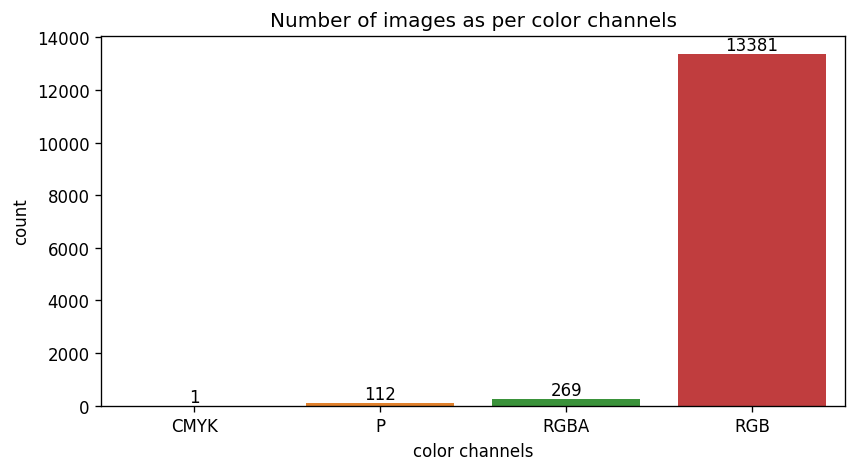

In [13]:
plot_dict(color_channel_dict, category='color channels', title='Number of images as per color channels')

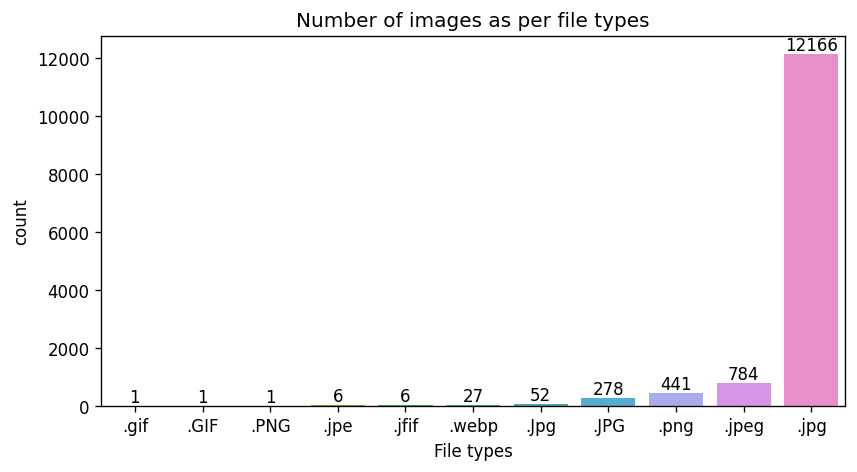

In [14]:
plot_dict(filetype_dict, category='File types', title='Number of images as per file types')

# Train-Test-Validation Splits:

In [15]:
def train_test_val_split(file_paths):
    train_files = {}
    test_files = {}
    val_files = {}
    
    def add_and_remove(dict_1, dict_2, n):
        for key in list(dict_1.keys()):
            paths = random.sample(dict_1[key], n)
            dict_2[key] += paths
            for path in paths:
                dict_1[key].remove(path)
        return dict_1, dict_2

    for path in file_paths:
        category = path.split('/')[-2]
        if category not in train_files:
            train_files[category] = [path]
            test_files[category] = []
            val_files[category] = []
        else:
            train_files[category] += [path]

    train_files, test_files = add_and_remove(train_files, test_files, 10)
    train_files, val_files = add_and_remove(train_files, val_files, 10)
    
    return train_files, test_files, val_files

In [16]:
train_dict, test_dict, val_dict = train_test_val_split(image_paths)

In [17]:
def build_tf_dataset_from_dict(dictionary, BATCH_SIZE=32, SEED=1024, shuffle=True, class_names=False):
    
    def load_and_preprocess_image(image_path, label):
        image = tf.io.read_file(image_path)
        image = tf.io.decode_image(image, channels=3, expand_animations=False)
        image = tf.io.encode_jpeg(image, format='rgb', quality=100)
        image = tf.io.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [224, 224])
        # image = tf.image.convert_image_dtype(image, tf.float32)
        return image, label
    
    AUTO = tf.data.AUTOTUNE
    
    img_paths = []
    labels = []
    for label, paths in dictionary.items():
        img_paths.extend(paths)
        labels.extend([label] * len(paths))

    # Convert labels to numerical format
    label_to_index = {label: idx for idx, label in enumerate(set(labels))}
    labels = [tf.one_hot(label_to_index[label], len(set(labels))) for label in labels]
    
    dataset = tf.data.Dataset.from_tensor_slices((img_paths, labels))
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=AUTO)
    
    if shuffle:
        dataset = dataset.shuffle(1024, seed=101)
    dataset = dataset.batch(BATCH_SIZE).prefetch(AUTO)
    
    return dataset

In [18]:
train_dataset = build_tf_dataset_from_dict(train_dict)
valid_dataset = build_tf_dataset_from_dict(val_dict)
test_dataset = build_tf_dataset_from_dict(test_dict)

In [19]:
classes = list(train_dict.keys())

# Image Augmentations:

In [20]:
def pack_to_dict(image, label):
    return {"images": image, "labels": label}

train_dataset = train_dataset.map(pack_to_dict, num_parallel_calls=tf.data.AUTOTUNE)

In [21]:
batch = next(iter(train_dataset.take(5)))
image_batch = batch["images"]
label_batch = batch["labels"]

def visualize_images(rows=2, cols=2, augmentation=None, images=image_batch):
    keras_cv.visualization.plot_image_gallery(
        augmentation(images) if augmentation else images,
        rows = rows,
        cols = cols,
        value_range = (0, 255),
        show = True,
    )

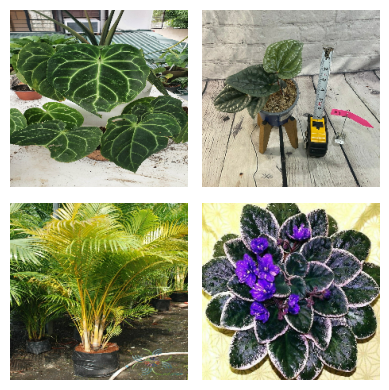

In [22]:
visualize_images()

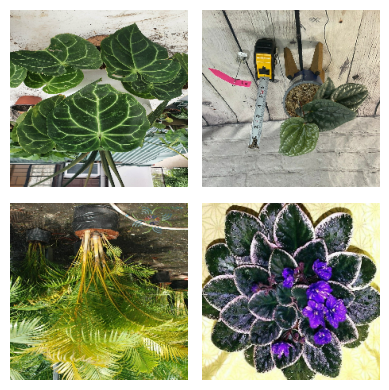

In [23]:
random_flip = keras_cv.layers.RandomFlip(
    mode = "horizontal_and_vertical"
)

augmenters = [random_flip]
visualize_images(augmentation = random_flip)

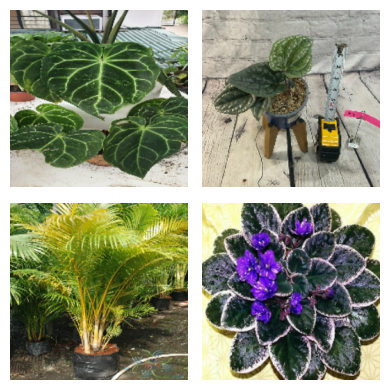

In [24]:
random_crop_and_resize = keras_cv.layers.RandomCropAndResize(
    target_size = (256, 256),
    crop_area_factor = (0.8, 1.0),
    aspect_ratio_factor = (0.9, 1.1),
)

augmenters += [random_crop_and_resize]
visualize_images(augmentation = random_crop_and_resize)

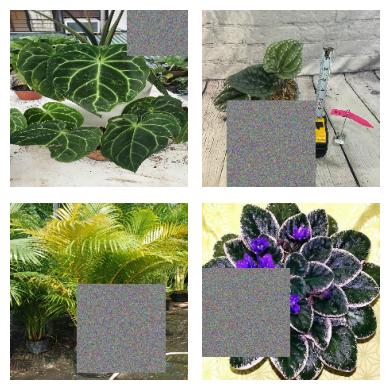

In [25]:
random_cutout = keras_cv.layers.RandomCutout(
    height_factor = (0.5, 0.5),
    width_factor = (0.5, 0.5),
    fill_mode = 'gaussian_noise'
)

augmenters += [random_cutout]
visualize_images(augmentation = random_cutout)

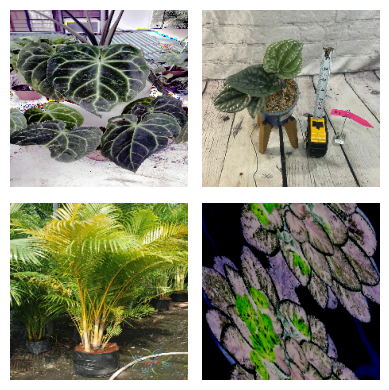

In [26]:
rand_augment = keras_cv.layers.RandAugment(
    value_range = (0, 255),
    augmentations_per_image = 5,
    magnitude = 0,
    magnitude_stddev = 1,
    rate = 10/11,
)

augmenters += [rand_augment]
visualize_images(augmentation = rand_augment)

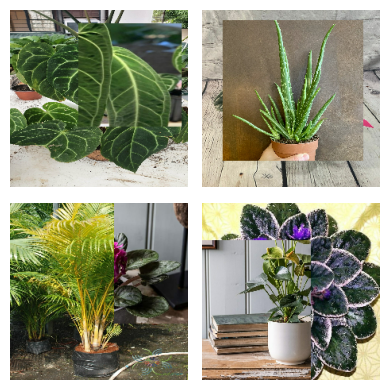

In [27]:
cut_mix = keras_cv.layers.CutMix()
inputs = {"images": image_batch, "labels": label_batch}
visualize_images(images = cut_mix(inputs)['images'])

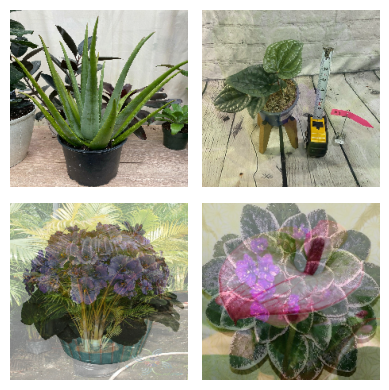

In [28]:
mix_up = keras_cv.layers.MixUp(0.5)
inputs = {"images": image_batch, "labels": label_batch}
visualize_images(images = mix_up(inputs)['images'])

In [29]:
cut_mix_or_mix_up = keras_cv.layers.RandomChoice(
    [cut_mix, mix_up], 
    batchwise = True
)
augmenters += [cut_mix_or_mix_up]

In [30]:
def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs
    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)
train_dataset = train_dataset.map(augmenter_fn, num_parallel_calls=tf.data.AUTOTUNE)

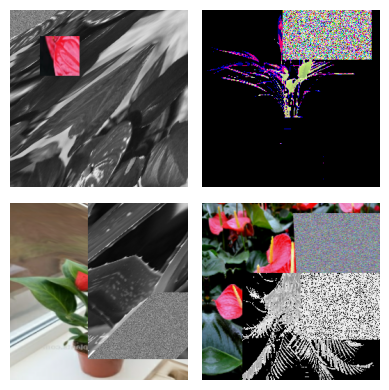

In [31]:
batch = next(iter(train_dataset.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

visualize_images(images = image_batch)

In [32]:
def unpackage_dict(inputs):
    return inputs["images"], inputs["labels"]

train_dataset = train_dataset.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)

# Model Building:

In [33]:
backbone = keras_cv.models.EfficientNetV2Backbone.from_preset(
    "efficientnetv2_s_imagenet",
    load_weights=True,
)

model = keras_cv.models.ImageClassifier(
    backbone=backbone,
    num_classes=len(classes),
)

In [34]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.AdamW(1e-4),
    metrics=[
        'accuracy',
        keras.metrics.TopKCategoricalAccuracy(
            k=5, name="top_5_accuracy",
        ),
    ]
)

model.summary()

Model: "image_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficient_net_v2s_backbone      │ (None, None, None,     │    20,331,360 │
│ (EfficientNetV2Backbone)        │ 1280)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 47)             │        60,207 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,391,567 (77.79 MB)

 Trainable params: 20,237,695 (77.20 MB)

 Non-trainable params: 153,872 (601.06 KB)

# Model Training:

In [35]:
earlystopping = keras.callbacks.EarlyStopping(
    monitor = 'val_accuracy',
    patience = 2,
    mode = 'max',
    min_delta = 0.005,
    verbose = 1,
    restore_best_weights = True
)

In [36]:
history = model.fit(
    train_dataset,
    epochs = 25,
    validation_data = valid_dataset,
    callbacks = [earlystopping],
)

Epoch 1/25
401/401 ━━━━━━━━━━━━━━━━━━━━ 574s 1s/step - accuracy: 0.1226 - loss: 3.3605 - top_5_accuracy: 0.4241 - val_accuracy: 0.0213 - val_loss: 4.8340 - val_top_5_accuracy: 0.1064
Epoch 2/25
401/401 ━━━━━━━━━━━━━━━━━━━━ 478s 1s/step - accuracy: 0.1382 - loss: 3.1776 - top_5_accuracy: 0.4051 - val_accuracy: 0.0766 - val_loss: 4.4098 - val_top_5_accuracy: 0.2234
Epoch 3/25
401/401 ━━━━━━━━━━━━━━━━━━━━ 454s 1s/step - accuracy: 0.2154 - loss: 2.9006 - top_5_accuracy: 0.5245 - val_accuracy: 0.1660 - val_loss: 3.8321 - val_top_5_accuracy: 0.3596
Epoch 4/25
401/401 ━━━━━━━━━━━━━━━━━━━━ 450s 1s/step - accuracy: 0.3296 - loss: 2.6107 - top_5_accuracy: 0.6599 - val_accuracy: 0.2319 - val_loss: 3.4140 - val_top_5_accuracy: 0.5043
Epoch 5/25
401/401 ━━━━━━━━━━━━━━━━━━━━ 452s 1s/step - accuracy: 0.4015 - loss: 2.3565 - top_5_accuracy: 0.7476 - val_accuracy: 0.2745 - val_loss: 3.1384 - val_top_5_accuracy: 0.5638
Epoch 6/25
401/401 ━━━━━━━━━━━━━━━━━━━━ 451s 1s/step - accuracy: 0.4865 - loss: 2.043

# Plotting Model Training Metrics:

In [37]:
def plot_model_metric(metric):
    plt.figure(dpi=120)
    plt.plot(history.history[metric], label=f'train_{metric}')
    plt.plot(history.history[f'val_{metric}'], label=f'val_{metric}')
    plt.xlabel('Epoch')
    plt.ylabel(metric)
    plt.legend()
    plt.title(f'{metric} over Epochs')
    plt.show();

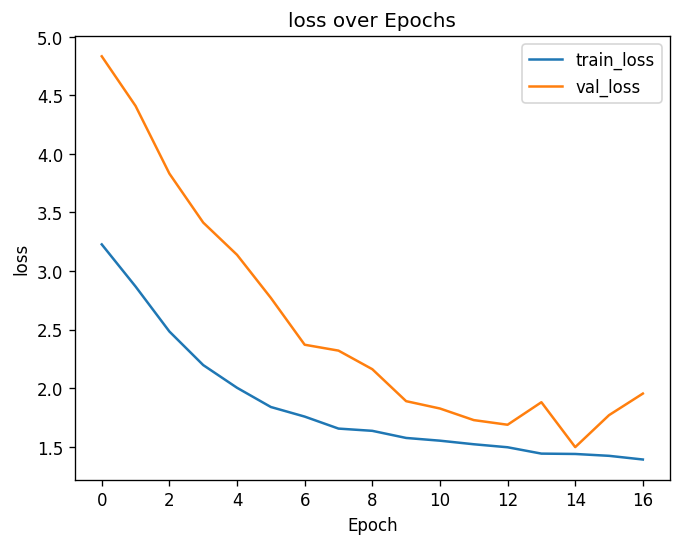

In [38]:
plot_model_metric('loss')

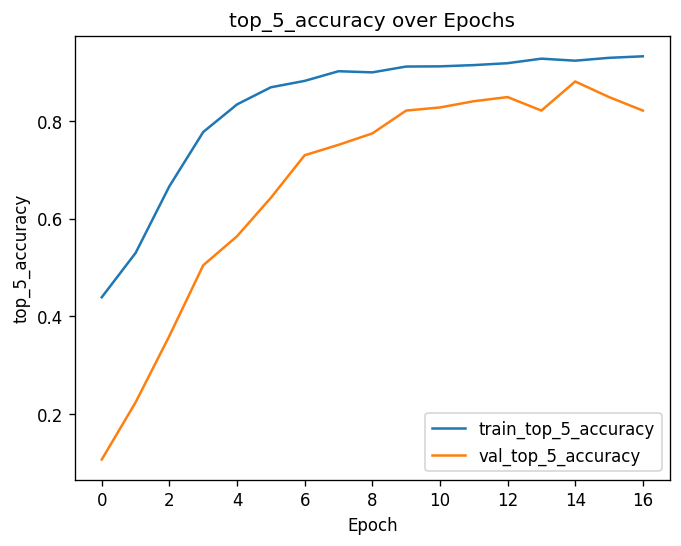

In [39]:
plot_model_metric('top_5_accuracy')

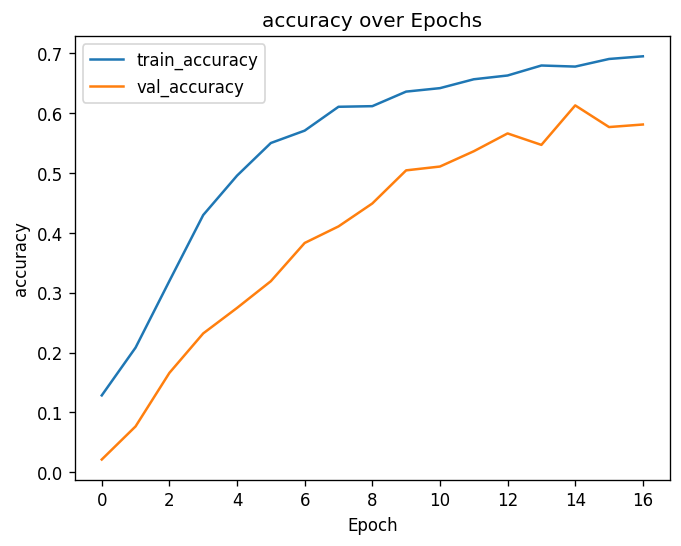

In [40]:
plot_model_metric('accuracy')

# Model Evaluation:

In [41]:
loss, accuracy, top_5_accuracy = model.evaluate(test_dataset, verbose=0)
template = "The model {0} on the test dataset is {1}."
print(template.format('loss', round(loss, 4)))
print(template.format('accuracy', f'{round(accuracy*100, 4)} %'))
print(template.format('top_5_accuracy', f'{round(top_5_accuracy*100, 4)} %'))

The model loss on the test dataset is 1.5843.
The model accuracy on the test dataset is 60.4255 %.
The model top_5_accuracy on the test dataset is 86.383 %.


In [42]:
# Function to display a grid of images with predictions and true labels
def display_images_with_predictions_and_true_labels(dataset, model, test_classes, num_images=9):
    plt.figure(figsize=(10, 10))

    # Take a batch from the dataset and select random images
    for images, labels in dataset.take(1):
        indices = np.random.choice(images.shape[0], num_images, replace=False)
        random_images = images.numpy()[indices]
        true_labels = labels.numpy()[indices]
        
        # Convert true labels to integer indices if they are one-hot encoded
        if len(true_labels.shape) > 1:
            true_labels = np.argmax(true_labels, axis=1)

        predictions = model.predict(random_images, verbose=0)
        predicted_labels = np.argmax(predictions, axis=1)

        for i in range(num_images):
            plt.subplot(3, 3, i + 1)
            plt.imshow(random_images[i].astype("uint8"))
            if true_labels[i] == predicted_labels[i]:
                color = 'green'
            else:
                color = 'red'
            plt.title(f"True: {test_classes[true_labels[i]]}\nPredicted: {test_classes[predicted_labels[i]]}",
                      color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

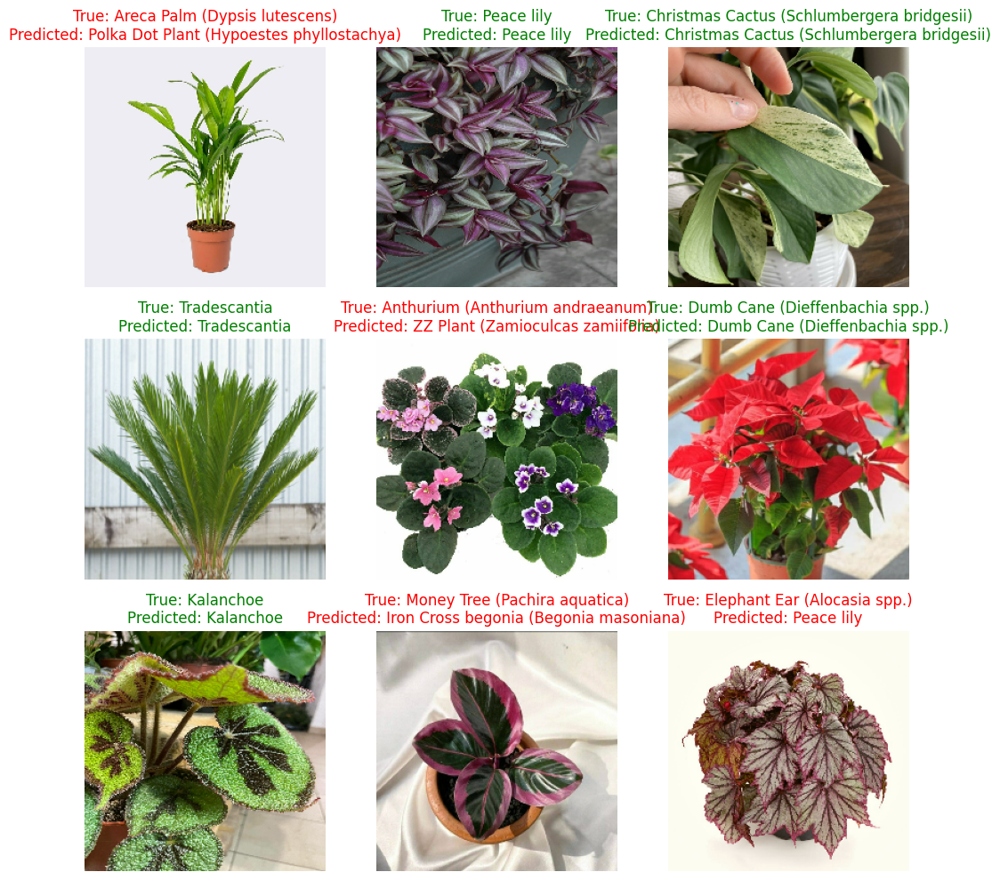

In [43]:
display_images_with_predictions_and_true_labels(test_dataset, model, classes)